# 🤖 **Model Benchmark — ETH + Media Features**

### 🎯 **Objective**
Evaluate whether adding **ETH media sentiment features** on top of ETH market features improves crash prediction compared to the market-only baseline (`03_model_benchmark_eth.ipynb`).

### ⚠️ **Problem Definition**
Binary classification task:

- `True` → Crash (>10% drop within 7 days)
- `False` → No crash

The target is a **boolean column** produced by the gold feature engineering pipeline.
The dataset is **highly imbalanced** (~3% crashes), making this a **rare event prediction problem** in a **time series context**.

### 🔬 **Benchmark Focus**

1. **Baseline comparison** — DummyClassifier, Logistic Regression
2. **Model comparison** — Random Forest, XGBoost, LightGBM, CatBoost
3. **Handling class imbalance** — class weights, scale_pos_weight, threshold tuning
4. **Evaluation metrics** — Recall, Precision, F1, **PR-AUC (main metric)**
5. **Model ranking** — Compare against market-only ETH baseline from notebook 03

### 🧪 **Benchmark Methodology**
TimeSeriesSplit cross-validation on the Train set. Metrics averaged across folds. Final comparison on PR-AUC.

### 📊 **Feature Set**

| Source | Features | Count |
|---|---|---|
| ETH market (notebook 03 EDA) | `return_1d`, `return_7d`, `volatility_7d`, `volatility_30d`, `buy_pressure`, `drawdown`, `ma_ratio`, `lag_return_1d`, `lag_return_7d`, `lag_volatility_7d`, `lag_buy_pressure`, `lag_volume_norm`, `momentum_acc`, `momentum_volatility`, `volume`, `number_of_trades`, `quote_asset_volume` | 17 |
| ETH media (notebook 05 EDA, combined score ≥ 0.10) | `avg_tone`, `article_count_ma_3`, `tone_ma_7` | 3 |
| **Total** | | **20** |

`tone_ma_30`, `tone_lag_7`, `tone_lag_1`, `article_count`, `article_count_lag_1` are **excluded** — combined score < 0.10 on the full dataset.

### 🚀 **Goal**
Determine whether **3 ETH media features** carry additional predictive signal beyond the 17 ETH market features. ETH media signal is weaker than BTC (max MI = 0.004 vs 0.036), so improvement may be marginal.

In [1]:
import pandas as pd
from pipelines.ml_benchmark import run_benchmark_pipeline

/home/pierre/Documents/Documents/crypto/crypto-prediction/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### **1. Load ETH Price and Media Data**

In [2]:
df_eth_price = pd.read_csv("../../data/gold/market/eth_usdt_1d_features.csv")
df_eth_media = pd.read_csv("../../data/gold/ethereum_tone_gold.csv")

print(f"ETH price : {df_eth_price.shape[0]} rows, {df_eth_price.shape[1]} columns")
print(f"ETH media : {df_eth_media.shape[0]} rows, {df_eth_media.shape[1]} columns")
print(f"Media columns: {list(df_eth_media.columns)}")

ETH price : 3114 rows, 30 columns
ETH media : 3145 rows, 9 columns
Media columns: ['date', 'avg_tone', 'article_count', 'tone_ma_7', 'tone_ma_30', 'tone_lag_1', 'tone_lag_7', 'article_count_ma_3', 'article_count_lag_1']


### **2. Date Alignment**

Both the price file (`open_time`) and the media file (`date`) store dates as plain ISO strings (`YYYY-MM-DD`).
A direct `pd.to_datetime` conversion is sufficient — no year-offset correction needed.

In [3]:
df_eth_price["open_time"] = pd.to_datetime(df_eth_price["open_time"], errors="coerce")
df_eth_media["date"]      = pd.to_datetime(df_eth_media["date"],      errors="coerce")

min_date = df_eth_price["open_time"].min()
max_date = df_eth_price["open_time"].max()

print(f"ETH price range : {min_date.date()} → {max_date.date()}")
print(f"Media range     : {df_eth_media['date'].min().date()} → {df_eth_media['date'].max().date()}")

df_eth_media = (
    df_eth_media
    .dropna(subset=["date"])
    .sort_values("date")
    .drop_duplicates("date", keep="last")
    .reset_index(drop=True)
)
df_eth_media = df_eth_media[
    (df_eth_media["date"] >= min_date) & (df_eth_media["date"] <= max_date)
].copy()
print(f"Media rows after filter: {df_eth_media.shape[0]}")

ETH price range : 2017-09-16 → 2026-03-26
Media range     : 2017-08-30 → 2026-04-09
Media rows after filter: 3114


### **3. Merge Price + Media (inner join)**

In [4]:
df = pd.merge(
    df_eth_price,
    df_eth_media,
    left_on="open_time",
    right_on="date",
    how="inner",
)

df.drop(columns=["open_time", "date"], inplace=True)
print(f"Merged dataset : {df.shape[0]} rows, {df.shape[1]} columns")
df.head()

Merged dataset : 3114 rows, 37 columns


,open,high,low,close,volume,quote_asset_volume,number_of_trades,taker_buy_base_volume,taker_buy_quote_volume,return_1d,...,ma_ratio,target,avg_tone,article_count,tone_ma_7,tone_ma_30,tone_lag_1,tone_lag_7,article_count_ma_3,article_count_lag_1
0,255.99,271.81,235.51,249.31,10362.06011,2.647152e+06,8859,3866.60141,995005.326705,-0.014585,...,0.850311,False,-0.841208,15,-0.812512,0.109498,-1.313378,-0.432653,39.666667,63
1,249.32,264.39,239.02,257.55,4614.53337,1.149704e+06,5277,1442.00382,360268.473861,0.033051,...,0.837263,False,-0.890143,19,-0.833427,0.065754,-0.841208,-0.743737,32.333333,15
2,257.53,306.22,257.11,294.57,4125.97051,1.182938e+06,3440,2342.68408,669740.521499,0.143739,...,0.835699,True,0.024966,28,-0.863693,0.029088,-0.890143,0.236825,20.666667,19
3,296.00,300.00,277.41,284.00,1869.90852,5.357736e+05,1896,789.82937,226839.706542,-0.035883,...,0.832508,False,-0.684177,71,-0.935344,-0.034358,0.024966,-0.182620,39.333333,28
4,284.01,294.00,275.91,282.00,1060.56734,3.027397e+05,1431,566.64637,162290.418587,-0.007042,...,0.838497,False,0.666324,33,-0.615243,-0.048459,-0.684177,-1.574382,44.000000,71


### **4. Feature Selection**

- **17 ETH market features** — identical to `03_model_benchmark_eth.ipynb` (from `03_eda_eth.ipynb`)
- **3 ETH media features** — selected in `05_eda_eth_price_and_media.ipynb` via combined score (|Spearman| + MI, normalized) ≥ 0.10:

| Feature | Combined Score | Note |
|---|---|---|
| `avg_tone` | 0.165 | Strongest ETH media signal (Spearman) |
| `article_count_ma_3` | 0.129 | MI-driven (0.004) |
| `tone_ma_7` | 0.129 | MI-driven (0.004) |

All other media features dropped — combined score < 0.10.

In [5]:
SELECTED_FEATURES = [
    # Momentum
    "return_1d", "return_7d",

    # Volatility
    "volatility_7d", "volatility_30d",

    # Market behavior
    "buy_pressure",

    # Risk
    "drawdown",

    # Trend
    "ma_ratio",

    # Lags
    "lag_return_1d", "lag_return_7d",
    "lag_volatility_7d",
    "lag_buy_pressure",
    "lag_volume_norm",

    # Additional
    "momentum_acc",
    "momentum_volatility",
    "volume",
    "number_of_trades",
    "quote_asset_volume",

    # Media enrichment — 3 features selected via combined score >= 0.10
    "avg_tone",
    "article_count_ma_3",
    "tone_ma_7",
]

TARGET = "target"

df = df[SELECTED_FEATURES + [TARGET]]

print(f"Dataset shape : {df.shape}")
print(f"Target distribution:\n{df[TARGET].value_counts()}")
df.isna().sum().loc[lambda s: s > 0]

Dataset shape : (3114, 21)
Target distribution:
target
False    2999
True      115
Name: count, dtype: int64


Series([], dtype: int64)

No NaN values expected — the inner join and gap-filled media file guarantee a complete dataset.

### **5. Model Benchmark**


=== Confusion matrix (OOF, global) — dummy ===


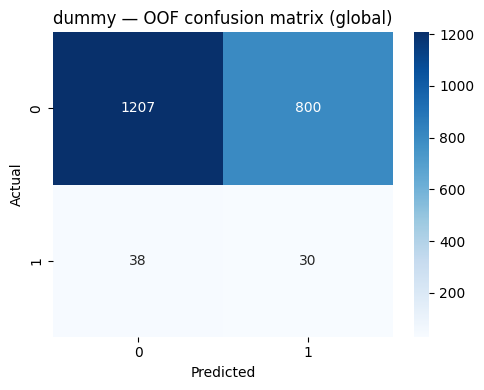


=== Confusion matrix (OOF, global) — logistic ===


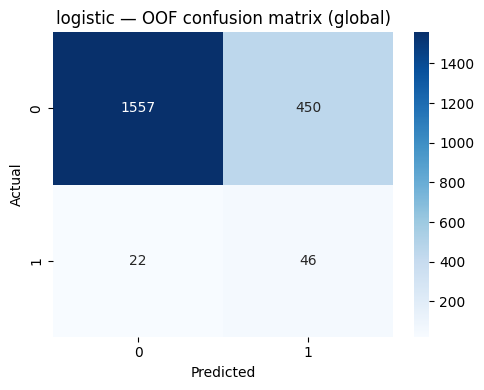


=== Confusion matrix (OOF, global) — random_forest ===


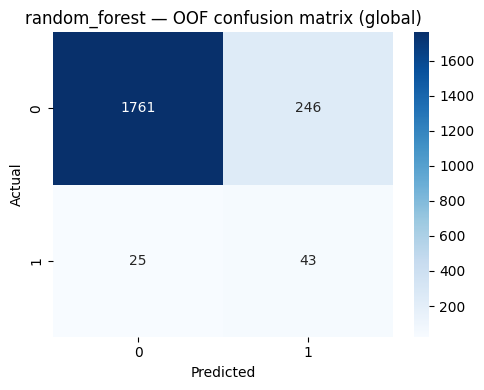


=== Confusion matrix (OOF, global) — xgboost ===


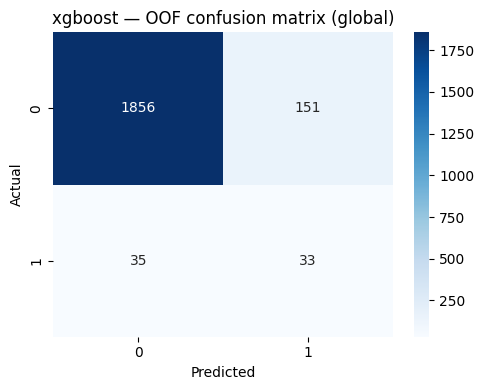

[LightGBM] [Info] Number of positive: 24, number of negative: 392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2739
[LightGBM] [Info] Number of data points in the train set: 416, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.057692 -> initscore=-2.793208
[LightGBM] [Info] Start training from score -2.793208
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

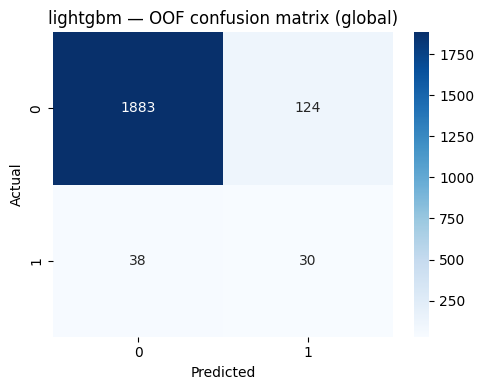


=== Confusion matrix (OOF, global) — catboost ===


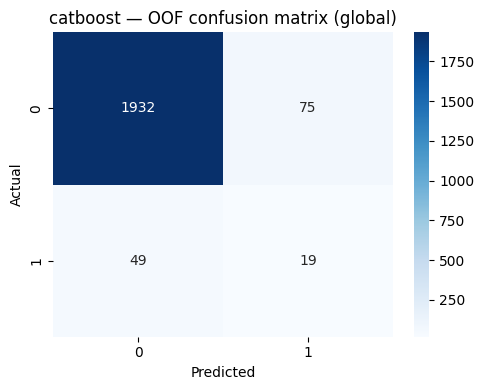

,precision,recall,f1,TP,FP,FN,TN,pr_auc
lightgbm,0.194805,0.441176,0.270270,30.000000,124.000000,38.000000,1883.000000,0.168939
xgboost,0.179348,0.485294,0.261905,33.000000,151.000000,35.000000,1856.000000,0.159242
random_forest,0.148789,0.632353,0.240896,43.000000,246.000000,25.000000,1761.000000,0.151110
catboost,0.202128,0.279412,0.234568,19.000000,75.000000,49.000000,1932.000000,0.147742
logistic,0.092742,0.676471,0.163121,46.000000,450.000000,22.000000,1557.000000,0.089380
dummy,0.036145,0.441176,0.066815,30.000000,800.000000,38.000000,1207.000000,0.035380
mean,0.142326,0.492647,0.206263,33.500000,307.666667,34.500000,1699.333333,0.125299
std,0.059827,0.131739,0.071298,8.958236,251.285141,8.958236,251.285141,0.047613


In [6]:
results = run_benchmark_pipeline(df, verbose=False, plot_confusion=True)

results_df = pd.DataFrame(results).T
results_df = results_df.sort_values("pr_auc", ascending=False)

# Summary rows
results_df.loc["mean"] = results_df.select_dtypes("number").mean()
results_df.loc["std"]  = results_df.select_dtypes("number").std()

results_df